## librosa: Audio and Music Signal Analysis in Python


### Brian McFee

Center for Data Science

and Music and Audio Research Lab


New York University

### What is MIR?

- Music Information Retrieval : http://ismir.net

- Expose musical content in useful ways
  - onsets, beats, structure
  - instrumentation, semantic tags, transcription
  - fingerprinting, covers, search and recommendation

### A typical MIR pipeline

1. **Analyze audio signals**
2. Fit statistical model
3. Conquer the world

### What is librosa?

- Audio signal analysis for music

- Reference implementations of common methods

- Building blocks for MIR systems

### Why?

- ISMIR2012: unconference session on python
  ![Photo credit: Sebasitan Stober](Ismir2012late-45-small.jpg)
- Lots of interest expressed, but little movement
- Key problem: lack of infrastructure

### Design goals

1. Low barrier to entry
2. Consistency, standard conventions
3. Backwards compatibility
4. Modularity
5. Readability and quality control

### Some quick demonstrations

* See the [paper](http://nipy.bic.berkeley.edu:5000/download/18) for a more detailed overview
* Or the [API docs](http://bmcfee.github.io/librosa/) for excruciating detail
* Or ``pip install librosa``

### 1. Loading and visualizing audio

In [1]:
# Enable plots in the notebook
%matplotlib inline                    
import matplotlib.pyplot as plt

# Seaborn makes our plots prettier
import seaborn
seaborn.set(style='ticks')

# Import the audio playback widget
from IPython.display import Audio 

# These are generally useful to have around
import numpy as np
import scipy

In [2]:
import librosa

`load()` returns the audio and sampling rate.

By default, all audio is resampled to `sr=`22KHz mono.

In [3]:
y, sr = librosa.load(librosa.util.example_audio_file())

In [4]:
type(y), type(sr)

(numpy.ndarray, int)

In [5]:
print y.shape
print sr

(1355168,)
22050


We can play back audio with the IPython audio widget

In [6]:
Audio(data=y, rate=sr)

The display module can plot waveforms.

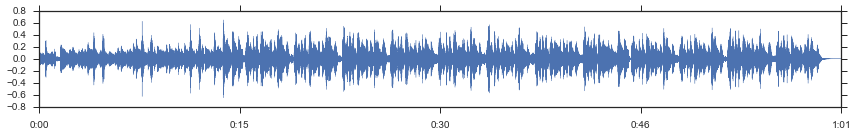

In [7]:
plt.figure(figsize=(12, 2))
librosa.display.waveplot(y, sr)

plt.tight_layout()

### 2. Spectrograms

Spectrograms are stored as 2-dimensional numpy arrays.

The first axis is frequency, and the second axis is time.

#### Some terminology...

* `sr` = sampling rate (Hz)
* `frame` = short audio clip ($\Leftrightarrow$ spectrogram column)
* `n_fft` = samples per frame (samples)
* `hop_length` = number of samples skipped between frames (samples)

/usr/local/lib/python2.7/dist-packages/matplotlib/axes/_axes.py:475: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


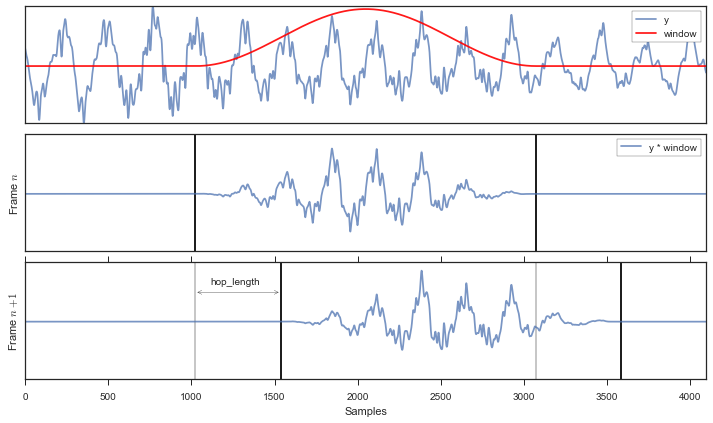

In [8]:
window = np.pad(scipy.signal.hann(2048, sym=False), [1024, 1024], mode='constant')

plt.figure(figsize=(10,6))
plt.subplot(3,1,1)
plt.plot(y[1024 + 4096:1024 + 8192], alpha=0.75, label='y')
plt.plot(window * y[1024 + 4096:1024 + 8192].max() / (1.05 * window.max()), alpha=0.9, color='r', label='window')
plt.xticks([])
plt.yticks([])
plt.legend(frameon=True)
plt.axis('tight')

plt.subplot(3,1,2)
plt.plot(y[1024 + 4096:1024 + 8192] * window, alpha=0.75, label='y * window')
plt.vlines([1024, 2048+1024],
           y[1024 + 4096:1024 + 8192].min(),
           y[1024 + 4096:1024 + 8192].max())
plt.xticks([])
plt.yticks([])
plt.ylabel('Frame $n$')
plt.legend(frameon=True)
plt.axis('tight')

plt.subplot(3,1,3)
plt.plot(y[1024 + 4096:1024 + 8192] * np.roll(window, 512), alpha=0.75)
plt.vlines([1024, 2048+1024],
           y[1024 + 4096:1024 + 8192].min(),
           y[1024 + 4096:1024 + 8192].max(),
           alpha=0.25)
plt.ylabel('Frame $n+1$')
plt.annotate('', xy=(1024, 0.05), xytext=(1024+512, 0.05), 
            arrowprops=dict(arrowstyle="<->",
                                #shrinkA=5, shrinkB=5,
                                ))
plt.text(1024+96, 0.065, 'hop_length')

plt.vlines([512 + 1024, 512 + 2048+1024],
           y[1024 + 4096:512 + 1024 + 8192].min(),
           y[1024 + 4096:512 + 1024 + 8192].max())
plt.legend(frameon=True)
plt.yticks([])
plt.xlabel('Samples')
plt.axis('tight')

plt.tight_layout()
plt.savefig('frames.png')

### Short-time Fourier Transform

Default settings:
* `sr=22050`
* `n_fft=2048`
* `hop_length=512`

STFTs are easy to compute:

In [9]:
D = librosa.stft(y)

### STFT anatomy
![STFT illustration](frames.png)

STFT spectra are complex, and include both magnitude and phase for each frequency bin.

In [10]:
print D.shape
print D.dtype

(1025, 2647)
complex64


Magnitude and phase can be separated and recombined:

In [11]:
S, phase = librosa.magphase(D)
print np.allclose(D, S * phase)

True


The display module can show spectrograms too.

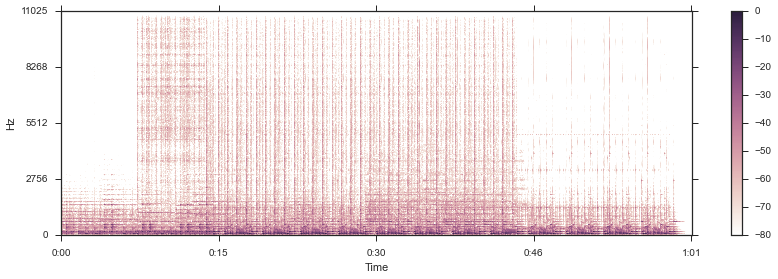

In [12]:
plt.figure(figsize=(12,4))
librosa.display.specshow(librosa.logamplitude(D**2, ref_power=np.max),
                         x_axis='time', y_axis='linear')
plt.colorbar()
plt.tight_layout()

All the action is in the bottom of the image!

We can fix this with a log-frequency axis.

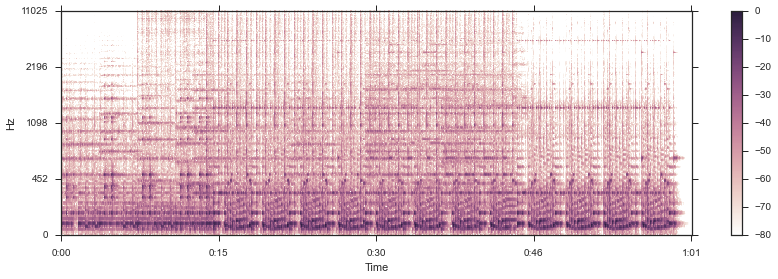

In [13]:
plt.figure(figsize=(12,4))
librosa.display.specshow(librosa.logamplitude(D**2, ref_power=np.max),
                         x_axis='time', y_axis='log')
plt.colorbar()
plt.tight_layout()

What if I want a direct log-frequency analysis?

Instead of STFT, we can use a *Constant-Q transform* (CQT).

In [14]:
C = librosa.cqt(y, sr)

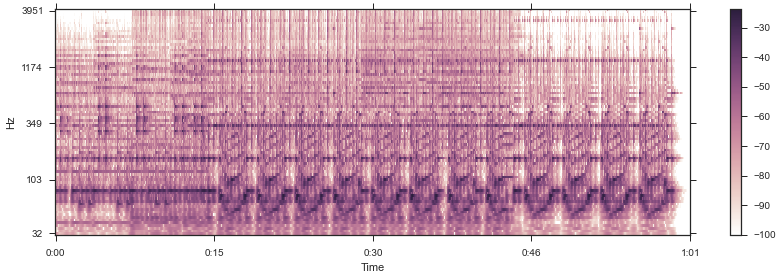

In [15]:
plt.figure(figsize=(12,4))
librosa.display.specshow(librosa.logamplitude(C**2),
                         x_axis='time', y_axis='cqt_hz')
plt.colorbar()
plt.tight_layout()

By default, `logamplitude` cuts at the top 80 dB.

Reducing to 40 should give a sparser image.

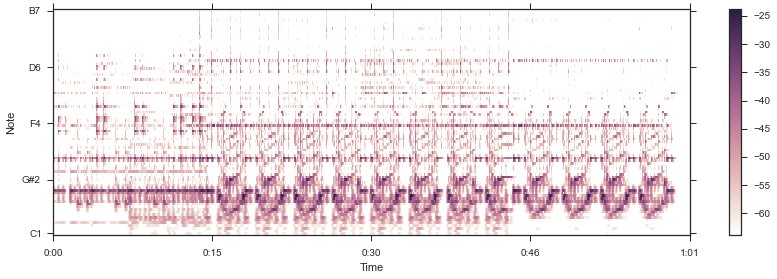

In [16]:
plt.figure(figsize=(12,4))
librosa.display.specshow(librosa.logamplitude(C**2,
                                              top_db=40),
                         x_axis='time', y_axis='cqt_note')
plt.colorbar()
plt.tight_layout()

### 3. Spectral features

Spectral features are often used to analyze harmony or timbre.

*CQT* measures the energy in each pitch.

*Chroma* measures the energy in each **pitch class**.

Each column is normalized by its peak energy.

In [17]:
chroma = librosa.feature.chroma_cqt(C=C, sr=sr)

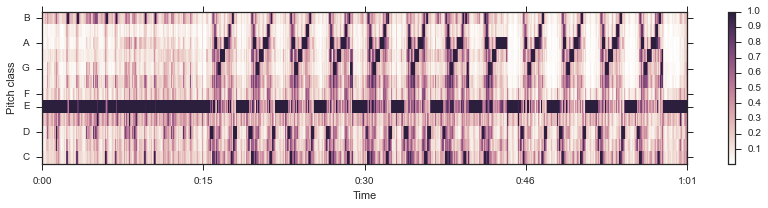

In [18]:
plt.figure(figsize=(12,3))
librosa.display.specshow(chroma, x_axis='time', y_axis='chroma')
plt.colorbar()

plt.tight_layout()

Other spectral features include Mel spectra, MFCC, and Tonnetz.

In [19]:
M = librosa.feature.melspectrogram(y=y, sr=sr)
MFCC = librosa.feature.mfcc(y=y, sr=sr)
tonnetz = librosa.feature.tonnetz(y=y, sr=sr)

... and lots more in the `feature` module

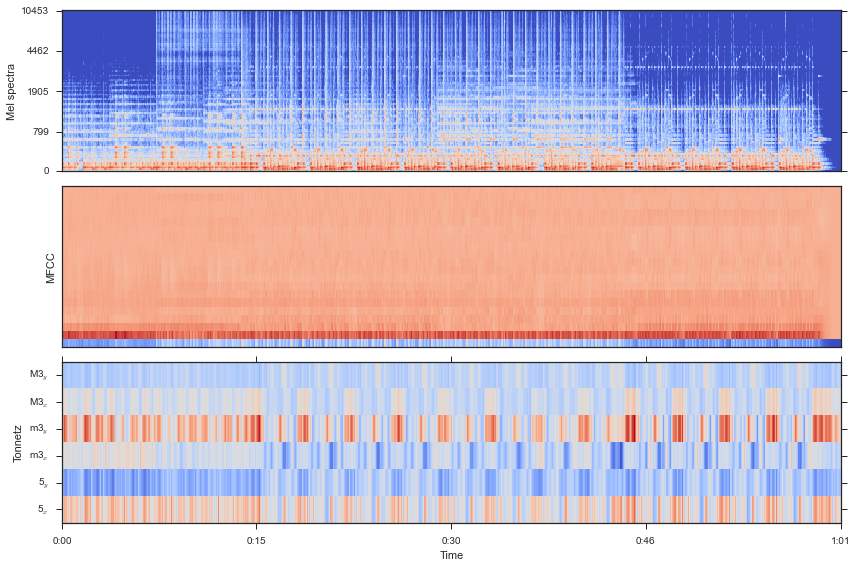

In [20]:
plt.figure(figsize=(12, 8))
plt.subplot(3,1,1)
librosa.display.specshow(librosa.logamplitude(M), y_axis='mel')
plt.ylabel('Mel spectra')

plt.subplot(3,1,2)
librosa.display.specshow(MFCC)
plt.ylabel('MFCC')

plt.subplot(3,1,3)
librosa.display.specshow(tonnetz, x_axis='time', y_axis='tonnetz')
plt.ylabel('Tonnetz')

plt.tight_layout()

### 4. Audio effects

The effects module provides simple audio manipulations.

We'll just show harmonic-percussive source separation.

Isolating components can result in cleaner feature representations.

In [21]:
y_harmonic, y_percussive = librosa.effects.hpss(y)

In [22]:
Audio(data=y, rate=sr)

In [23]:
Audio(data=y_harmonic, rate=sr)

In [24]:
Audio(data=y_percussive, rate=sr)

Now compare full vs harmonic chroma:

In [25]:
C_harmonic = librosa.feature.chroma_cqt(y_harmonic, sr)

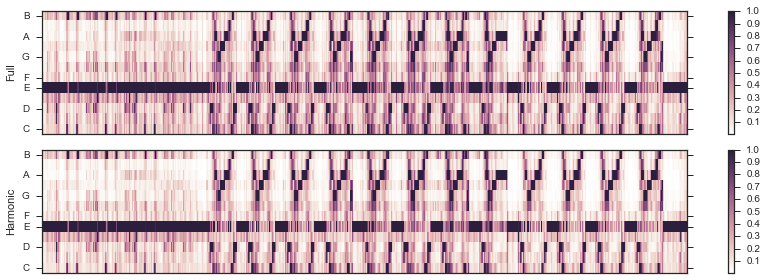

In [26]:
plt.figure(figsize=(12, 4))

plt.subplot(2,1,1)
librosa.display.specshow(chroma, y_axis='chroma')
plt.colorbar(), plt.ylabel('Full')

plt.subplot(2,1,2)
librosa.display.specshow(C_harmonic, y_axis='chroma')
plt.colorbar(), plt.ylabel('Harmonic')

plt.tight_layout()

### 5. Onsets and beats

Note onsets and beat timings can be estimated using the `onset` and `beat` modules.

In [27]:
onset_envelope = librosa.onset.onset_strength(y, sr)

Onset events can be detected as well

In [28]:
onsets = librosa.onset.onset_detect(onset_envelope=onset_envelope)

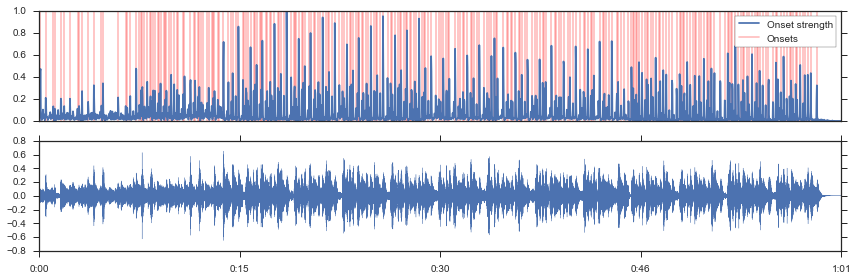

In [29]:
plt.figure(figsize=(12, 4))

plt.subplot(2, 1, 1)
plt.plot(onset_envelope, label='Onset strength')
plt.vlines(onsets, 0, onset_envelope.max(), color='r', alpha=0.25, label='Onsets')
plt.xticks([])
plt.legend(frameon=True)
plt.axis('tight')

plt.subplot(2, 1, 2)
librosa.display.waveplot(y, sr)
plt.tight_layout()

Onset strength is used to track beats and estimate tempo:

In [30]:
tempo, beats = librosa.beat.beat_track(onset_envelope=onset_envelope)

In [31]:
tempo

129.19921875

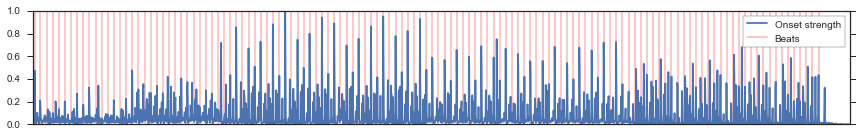

In [32]:
plt.figure(figsize=(12, 2))

plt.plot(onset_envelope, label='Onset strength')
plt.vlines(beats, 0, onset_envelope.max(), color='r', alpha=0.25, label='Beats')
plt.xticks([])
plt.legend(frameon=True)
plt.axis('tight')
plt.tight_layout()

Beat events are in frame numbers (the units of ``onset_envelope``)

These can be converted back into time (in seconds), and sonified with `mir_eval`.

In [33]:
beat_times = librosa.frames_to_time(beats)

In [34]:
import mir_eval
y_click = mir_eval.sonify.clicks(beat_times, sr, length=len(y))

In [35]:
Audio(data=y + y_click, rate=sr)

### 6. Recurrence and structure

Finally, some basic functions to detect harmonic repetition and structure in music.

Beat-synchronous feature aggregation can stabilize features and reduce complexity.

In [36]:
c_sync = librosa.feature.sync(C_harmonic, beats, aggregate=np.median)

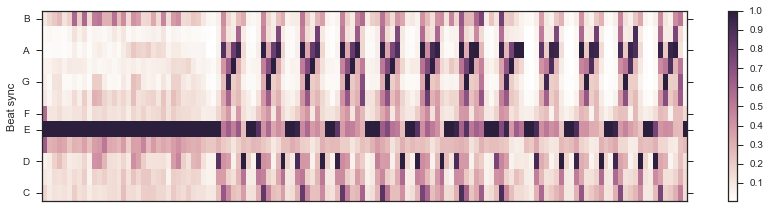

In [47]:
plt.figure(figsize=(12, 3))
librosa.display.specshow(c_sync, y_axis='chroma')
plt.colorbar(), plt.ylabel('Beat sync')
plt.tight_layout()

We can also context with history embedding.

This stacks together multiple shifted copies of the input.

In [37]:
chroma_stack = librosa.feature.stack_memory(c_sync,
                                            n_steps=3,
                                            mode='edge')

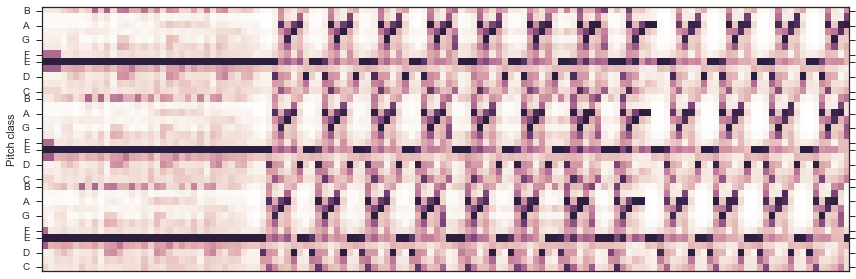

In [38]:
plt.figure(figsize=(12, 4))
librosa.display.specshow(chroma_stack, y_axis='chroma')
plt.tight_layout()

The recurrence matrix shows the nearest neighbor linkage for each column of the input.

Chroma recurrence can encode harmonic repetitions and high-level structure.

In [39]:
R = librosa.segment.recurrence_matrix(chroma_stack, sym=True)

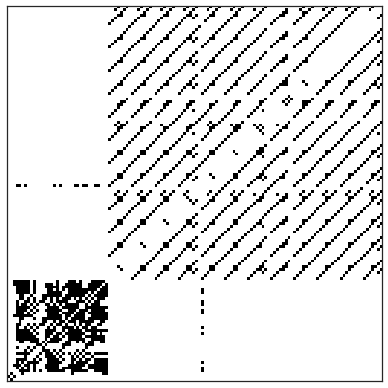

In [40]:
# Diagonal lines indicate repeated progressions
librosa.display.specshow(R, aspect='equal')

plt.tight_layout()

Post-processing this matrix can extract structural components.

### Summary

* librosa provides building blocks for music analysis

* 0.4.0 was just released

* Development continues!

### But wait... there's more!

* [API reference](http://pythonhosted.org/librosa/) - http://pythonhosted.org/librosa/
* [Github repository](https://github.com/bmcfee/librosa) - https://github.com/bmcfee/librosa
  * + example applications and notebooks

### Awesome contributors

* Colin Raffel, Dan Ellis, Dawen Liang, Eric Battenberg, Matt McVicar, and Oriol Nieto

### Thanks!


Contact info:

* <brian.mcfee@nyu.edu>
* http://bmcfee.github.io/
* `@functiontelechy`